# MTH9855_HW2_Chi Franklin Ma
by R programming

In [1]:
version$version.string

[1] "R version 3.1.2 (2014-10-31)"

## Problem 1.2
The datasets "BetaExample" contains the daily return of TSLA, AAPL, and IBM   
     
<font color = "blue">Answer Snapshot: (you can check the process if you want)    
* a. Reject the null hypothesis (Beta = 0) for all three assets, all Betas are significantly NOT zero
* b. Holding vector is as below to make it Beta = 0    
    AAPL = 1    
    TSLA = -0.5691    
    IBM = -0.4309    
* c. Please refer to the plot below
* d. We cannot reject the null hypothesis. Portfolio beta is significantly zero, which means our Beta neutral strategy works fine in out-of-sample data. 


In [2]:
data <- read.table("C:/Baruch MFE/Portfolio Management/Lec2/BetaExample.txt", sep = "|", header = T)

In [3]:
# get each stock's subset data
TSLA <- subset(data, data$TICKER == "TSLA")
IBM <- subset(data, data$TICKER == "IBM")
AAPL <- subset(data, data$TICKER == "AAPL")


ending_date_TSLA <- which(TSLA$DATE == "2014-12-31")  # get the index of Dec 31, 2014
ending_date_IBM <- which(IBM$DATE == "2014-12-31")
ending_date_AAPL <- which(AAPL$DATE == "2014-12-31")


TSLA_insample <- TSLA[1:ending_date_TSLA, ]  # data from 1990 to 2014
IBM_insample <- IBM[1:ending_date_IBM, ]
AAPL_insample <- AAPL[1:ending_date_AAPL, ]


Call:
lm(formula = TSLA_insample$R ~ 0 + TSLA_insample$RM)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.186792 -0.014769  0.000752  0.016438  0.248859 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
TSLA_insample$RM   1.3101     0.1044   12.55   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.03426 on 1134 degrees of freedom
  (5166 observations deleted due to missingness)
Multiple R-squared:  0.1219,	Adjusted R-squared:  0.1211 
F-statistic: 157.4 on 1 and 1134 DF,  p-value: < 2.2e-16


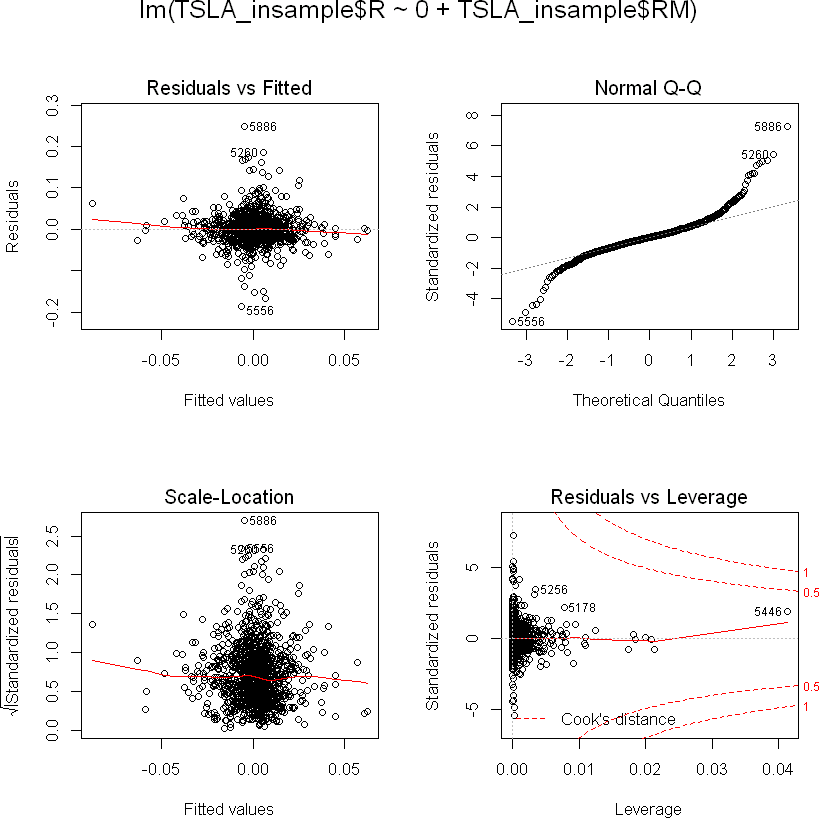

In [4]:
# Tesla
opar <- par(mfrow = c(2,2), oma = c(0, 0, 1.1, 0))
lm.TSLA <- lm(TSLA_insample$R ~ 0 + TSLA_insample$RM)
plot(lm.TSLA)
par(opar)
# anova(lm.TSLA)
summary(lm.TSLA)


Call:
lm(formula = IBM_insample$R ~ 0 + IBM_insample$RM)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.150154 -0.006408 -0.000073  0.006547  0.122888 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
IBM_insample$RM   0.9067     0.0162   55.97   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.01468 on 6300 degrees of freedom
Multiple R-squared:  0.3321,	Adjusted R-squared:  0.332 
F-statistic:  3133 on 1 and 6300 DF,  p-value: < 2.2e-16


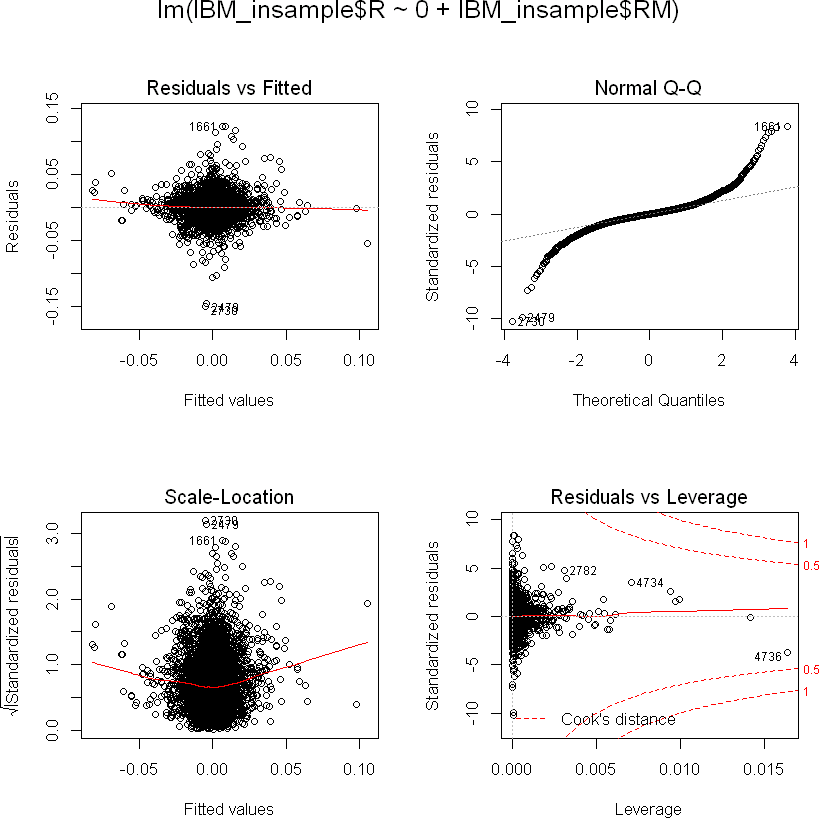

In [5]:
# IBM
opar <- par(mfrow = c(2,2), oma = c(0, 0, 1.1, 0))
lm.IBM <- lm(IBM_insample$R ~ 0 + IBM_insample$RM)
plot(lm.IBM)
par(opar)
# anova(lm.IBM)
summary(lm.IBM)


Call:
lm(formula = AAPL_insample$R ~ 0 + AAPL_insample$RM)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.50172 -0.01177 -0.00009  0.01263  0.32279 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
AAPL_insample$RM  1.13630    0.02934   38.73   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.02659 on 6300 degrees of freedom
Multiple R-squared:  0.1923,	Adjusted R-squared:  0.1922 
F-statistic:  1500 on 1 and 6300 DF,  p-value: < 2.2e-16


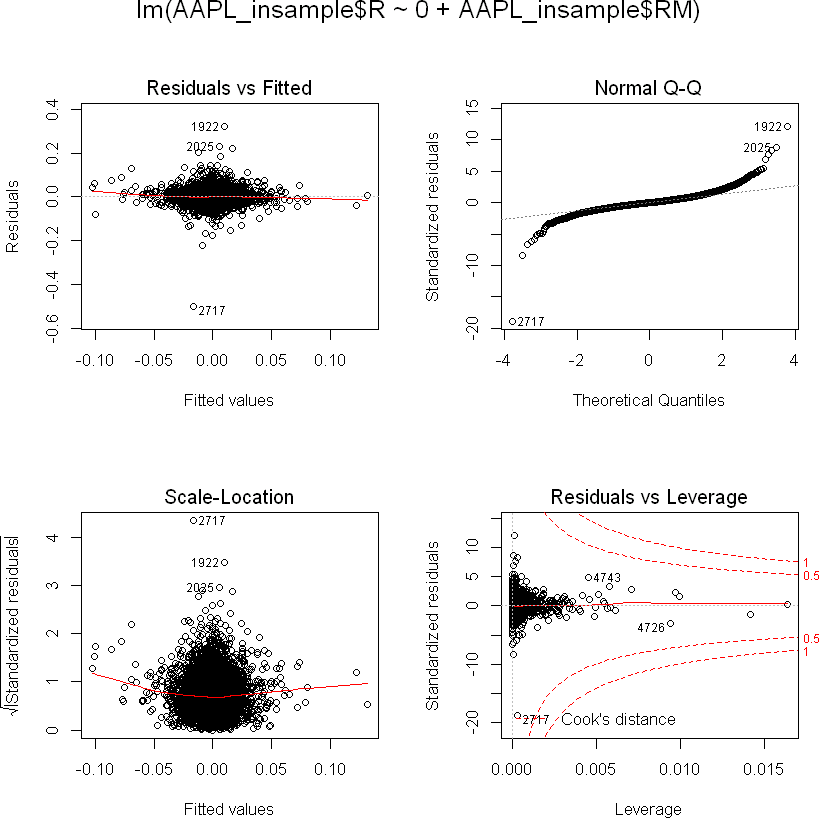

In [6]:
# AAPL
opar <- par(mfrow = c(2,2), oma = c(0, 0, 1.1, 0))
lm.AAPL <- lm(AAPL_insample$R ~ 0 + AAPL_insample$RM)
plot(lm.AAPL)
par(opar)
#anova(lm.APPL)
summary(lm.AAPL)

In [13]:
cat("The Beta for TSLA is:", lm.TSLA$coefficients, "t-stats is:", summary(lm.TSLA)$coefficients[3], "\n")
cat("The Beta for IBM is:", lm.IBM$coefficients, "t-stats is:", summary(lm.IBM)$coefficients[3], "\n")
cat("The Beta for AAPL is:", lm.AAPL$coefficients, "t-stats is:", summary(lm.AAPL)$coefficients[3])


The Beta for TSLA is: 1.310085 t-stats is: 12.54786 
The Beta for IBM is: 0.9067384 t-stats is: 55.97004 
The Beta for AAPL is: 1.1363 t-stats is: 38.72828

__Conclustion__:   
__As t-stats are all very large, we do not reject the null hypothesis, all Betas are significantly not zero__

In [14]:
# (b)
beta_TSLA <- lm.TSLA$coefficients
beta_IBM <- lm.IBM$coefficients
beta_AAPL <- lm.AAPL$coefficients

In [32]:
# Beta of Portfolio is calculated by h' * Beta, here Beta of portfolio == 0
# h[TSLA] + h[IBM] + h[APPL] == 0 due to self-finance condition
A <- matrix(data=c(beta_TSLA, beta_IBM, 1, 1), nrow=2, ncol=2, byrow=TRUE) 
b <- matrix(data=c(-beta_AAPL, -1), nrow=2, ncol=1, byrow=FALSE)
h_withoutAAPL <- round(solve(A, b), 4)
h <- rbind.data.frame(1,h_withoutAAPL)
rownames(h) <- c("AAPL", "TSLA", "IBM")
colnames(h) <- "Holdings"
h

,Holdings
AAPL,1
TSLA,-0.5691
IBM,-0.4309


__The holdings is long 1 Dollar position in Apple, short 0.582 and 0.418 in Tesla and IBM__

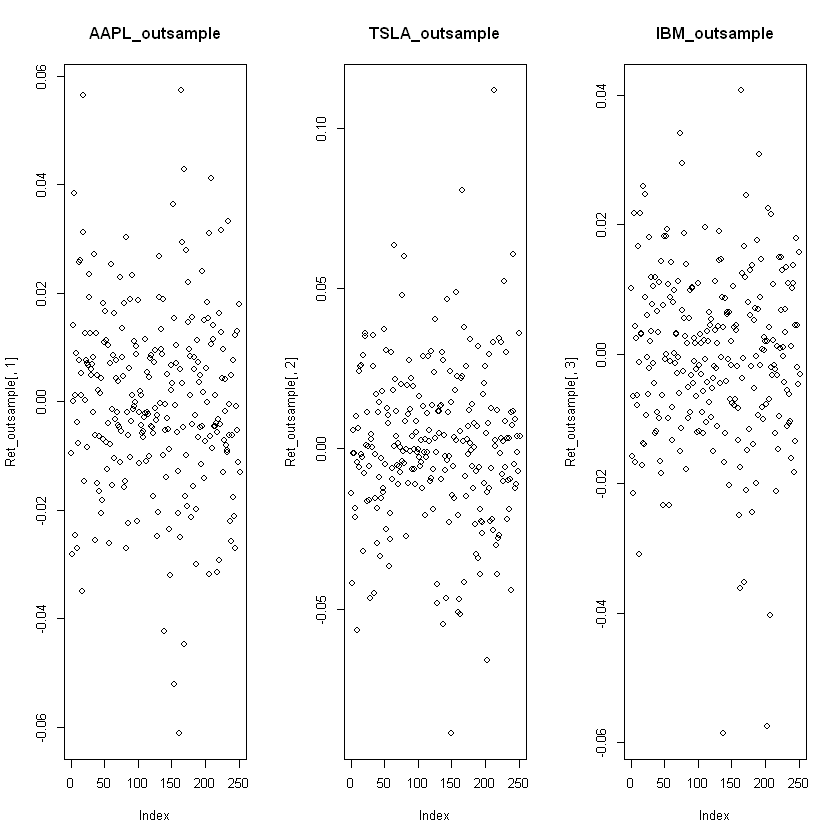

In [17]:
# (c)

h <- as.matrix(h)
TSLA_outsample <- TSLA[(ending_date_TSLA+1):dim(TSLA)[1], ]
IBM_outsample <- IBM[(ending_date_IBM+1):dim(IBM)[1], ]
AAPL_outsample <- AAPL[(ending_date_AAPL+1):dim(AAPL)[1], ]
Ret_outsample <- cbind(AAPL_outsample$R, TSLA_outsample$R, IBM_outsample$R )
Ret_outsample <- as.matrix(Ret_outsample)
par(mfrow = c(1,3))
plot(Ret_outsample[,1], main = "AAPL_outsample")
plot(Ret_outsample[,2], main = "TSLA_outsample")
plot(Ret_outsample[,3], main = "IBM_outsample")

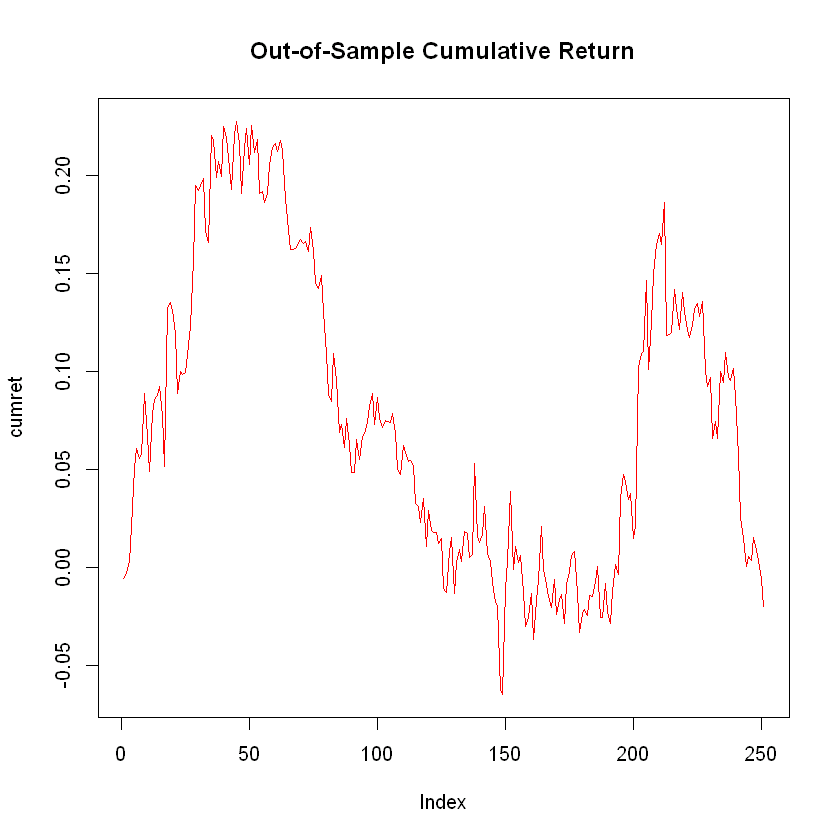

In [29]:
options(warn=-1)
Ret_pt <- Ret_outsample %*% h  # the P&L of the portfolio
library(quantmod)
cumret <- cumsum(Ret_pt)
plot(cumret, type = "l", col = "red", main = "Out-of-Sample Cumulative Return")

# plot(Ret_pt, type = "b", col = "red")
#title("Return of Self-Financing Portfolio")

# n <- length(PnL)
# log_ret <- log(PnL[-1]/PnL[-n])
# plot(log_ret, type = 'b', col = "red")
# plot(PnL)


Call:
lm(formula = Ret_pt ~ 0 + Ret_mkt)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.067285 -0.010402 -0.000608  0.008459  0.081480 

Coefficients:
        Estimate Std. Error t value Pr(>|t|)
Ret_mkt   0.0548     0.1188   0.461    0.645

Residual standard error: 0.01833 on 250 degrees of freedom
Multiple R-squared:  0.0008511,	Adjusted R-squared:  -0.003146 
F-statistic: 0.213 on 1 and 250 DF,  p-value: 0.6449


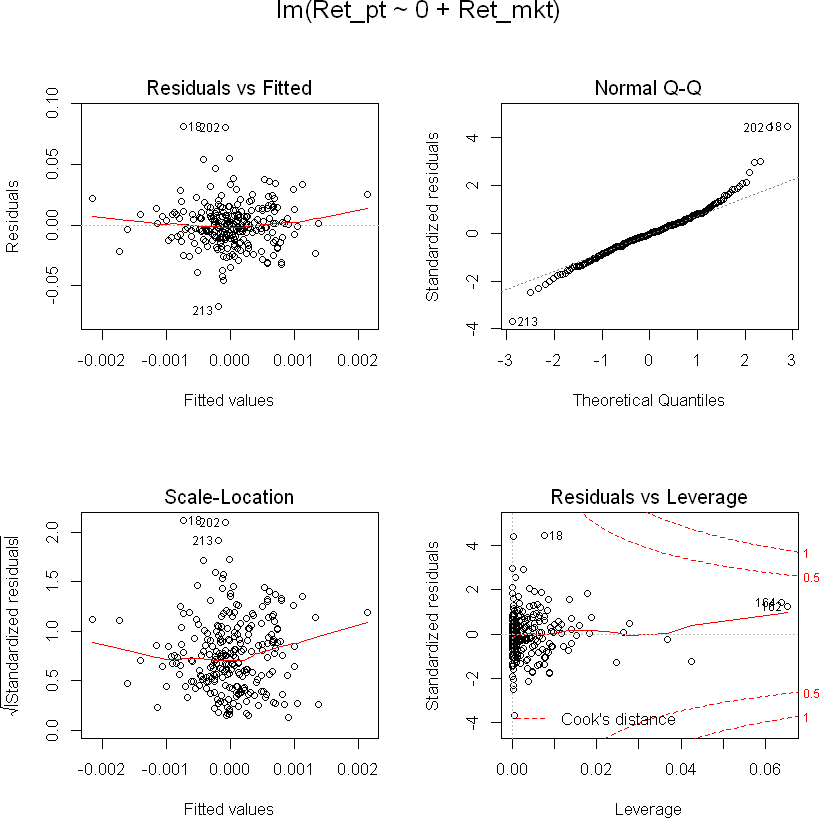

In [21]:
# (d)

Ret_mkt <- IBM_outsample$RM
opar <- par(mfrow = c(2,2), oma = c(0, 0, 1.1, 0))
lm.OutSample <- lm(Ret_pt ~ 0 + Ret_mkt)
plot(lm.OutSample)
par(opar)
#anova(lm.OutSample)
summary(lm.OutSample)

In [24]:
cat("The Beta (Correlation) is:", lm.OutSample$coefficients, "t-stats is:", summary(lm.OutSample)$coefficients[3], "\n")

The Beta (Correlation) is: 0.05480306 t-stats is: 0.461468 


__Conclusion:__   
* The p value is 0.645, which is larger than 0.05, so we cannot reject the null hypothesis(beta = 0)
* The realized correlation is <font color = "red">ZERO</font> significantly at 95% confidence interval
* __In other words, our beta neutral portfolioperform well in out-of-sample data.__

## Problem 1.3
Fund of Fund

### (a) 
Please refer to the handwriting part. NOTE, the expectation of error term is __not equal to ZERO__. The error term is the alpha part.



### (b)
The derivation part is on handwriting part. Here we plot f/(f+g) in terms of n

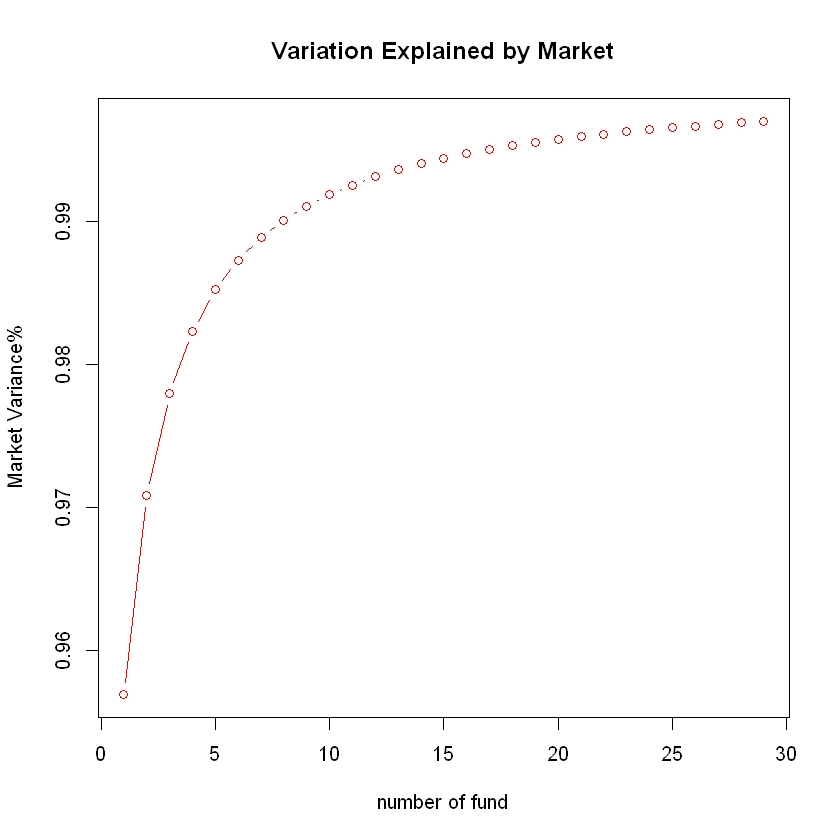

In [25]:
# (b)
# R.n is the function of f/(f+g)

R.n <- function(n){
    return ((100 * n) / (100 * n + 9))
}

n <- c(2:30)
plot(R.n(n), col = "red", type = "b", main = "Variation Explained by Market", xlab = "number of fund", ylab = "Market Variance%")

<font color = red>__Conclusion: More funds we invest, more return is from market part__

### (c) 
The derivation part is in handwriting part. Please refer to that. Here we only plot.

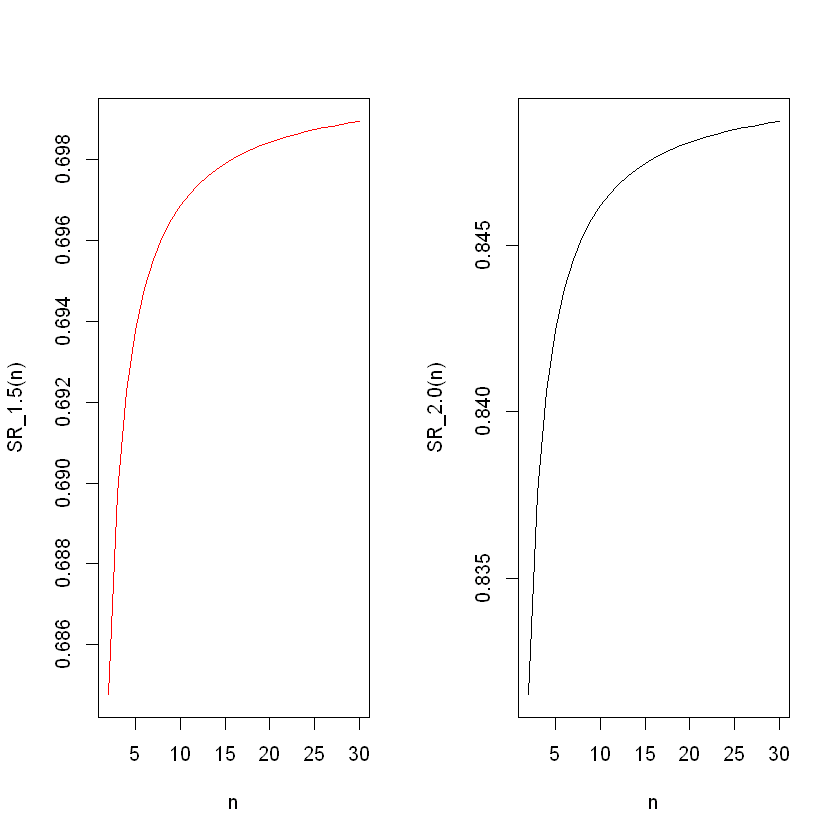

In [26]:
# (c)
# SR function is to calculate the Sharpe Ratio of portfolio in terms of number of funds n
# SR_1.5 is the Sharpe ratio given error term's Sharpe is 1.5
SR_1.5 <- function(n){
    return ( (7.0 * sqrt(n)) /sqrt(100 * n + 9.0))
}

# SR_2.0 is the Sharpe ratio given error term's Sharpe is 2.0
SR_2.0 <- function(n){
    return ((8.5 * sqrt(n))/sqrt(100 * n + 9.0))
}

n <- c(2:30)
par(mfrow = c(1,2))
plot(n, SR_1.5(n), col = "red", type = "l")
plot(n, SR_2.0(n), type = "l")

__Conclusion:__
1. Portfolio Sharpe Ratio increases with increase of the number of fund invested
2. Portfolio Sharpe Ratio increases with increase of the Sharpe Ratio of error term

### (d) 
Since Beta = 0, all return is from error term, if there is only on fund to invest, the Sharpe Ratio is exactly the fund Sharpe Ratio itself. Like 1.5 or 2.0, which are both higher than our previous portfolio. In terms of Sharpe Ratio, portfolio in (d) is better, since it is a "pure Alpha" strategy.

** _Written by Chi Franklin Ma, Sep 23, 2016_ **